In [1]:
import gymnasium as gym
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
import matplotlib.dates as mdates
from gl_gym.environments.utils import co2ppm2dens
from sklearn.metrics import mean_absolute_error, r2_score
from sklearn.preprocessing import StandardScaler

# Регистрирует среду gl_gym/GreenLightTomato-v0 в реестре Gymnasium
import gl_gym

# Для rule-based контроллера
from gl_gym.components.rule_based import RuleBasedController
from gl_gym.core.types import StepContext

# Настройки matplotlib
plt.rcParams["figure.figsize"] = (14, 5)
plt.rcParams["axes.grid"] = True
plt.rcParams["font.size"] = 11

print("Все библиотеки загружены.")

Все библиотеки загружены.


In [2]:
# Контроллер с параметрами по умолчанию из GreenLight
controller = RuleBasedController(
    # Лампы: включены с 0:00 до 18:00, весь сезон
    lamps_on=0, lamps_off=18, lamps_day_start=-1, lamps_day_stop=366,
    lamps_off_sun=400,          # выключить при солнечной радиации > 400 Вт/м²
    lamp_rad_sum_limit=10,      # лимит суммарной радиации для ламп (MJ/m²/день)
    # Уставки температуры
    temp_setpoint_day=19.5,     # дневная уставка (°C)
    temp_setpoint_night=16.5,   # ночная уставка (°C)
    heat_correction=0,          # коррекция при работе ламп
    heat_deadzone=5,            # мёртвая зона перегрева (°C)
    # CO₂ и вентиляция
    co2_day=800,                # дневная уставка CO₂ (ppm)
    vent_heat_Pband=4,          # П-зона вентиляции при перегреве
    rh_max=85,                  # макс. влажность (%)
    mech_dehumid_Pband=2,
    vent_rh_Pband=5,            # П-зона вентиляции по влажности
    t_vent_off=1,               # откл. вентиляции при холоде
    vent_cold_Pband=-1,
    # Термоэкран
    thScrSpDay=5, thScrSpNight=10, thScrPband=-1, thScrDeadZone=4,
    thScrRh=-2, thScrRhPband=2,
    # Прочие
    lampExtraHeat=2, blScrExtraRh=100, rhMax=85,
    tHeatBand=-1, co2Band=-100, useBlScr=1,
)

def build_step_context(env):
    """Собирает контекст текущего шага для rule-based контроллера."""
    raw = env.unwrapped
    return StepContext(
        t=raw.timestep, dt=raw.dt, Np=raw.Np,
        x_prev=raw.x_prev, x=raw.x, u=raw.u, p=raw.p,
        d=raw.weather_data,
        hour_of_day=raw.hour_of_day, day_of_year=raw.day_of_year,
    )


In [3]:
N_DAYS = 60 # Укажите нужное количество дней
PERIOD = 900
STEPS_PER_DAY = int(86400 / PERIOD) # 96 шагов

START_DATE = "2010-02-28"

# Среда с полным вектором состояний
env_full = gym.make(
    "gl_gym/GreenLightTomato-v0",
    normalize_actions=False,
    observation_modules=[
        "IndoorClimateObservations",
        "WeatherObservations",
        "BasicCropObservations"
    ],
    max_episode_steps= N_DAYS * STEPS_PER_DAY
)

obs, _ = env_full.reset(seed=42)
hours = []         # время в часах
temps_in = []      # температура внутри
temps_out = []     # температура снаружи
co2_levels = []    # уровень CO₂ внутри
co2_out_levels = []  # уровень CO₂ снаружи
rh_levels = []     # влажность
radiation = []     # солнечная радиация
co2_mg_per_m3 = []  # плотность CO₂ в мг/м³
cfruit = []        # сухая масса плодов, мг/м²
actions_history = []  # для хранения истории действий


NOISE_SCALE = 0.1
NOISE_PERIOD = 5

current_noise_step = NOISE_PERIOD
noise = None
while True:
    ctx = build_step_context(env_full)
    base_action = controller.predict(ctx).astype(np.float32)
    if (current_noise_step >= NOISE_PERIOD):
        noise = np.random.normal(loc=0.0, scale=NOISE_SCALE, size=base_action.shape)
        current_noise_step = 0
        
    noisy_action = base_action + noise

    action = np.clip(
        noisy_action, 
        env_full.action_space.low, 
        env_full.action_space.high
    ).astype(np.float32)
    obs, _, terminated, truncated, _ = env_full.step(action)
    temps_in.append(obs["IndoorClimateObservations"][1])   # температура внутри, °C
    temps_out.append(obs["WeatherObservations"][1])        # температура снаружи, °C
    co2_levels.append(obs["IndoorClimateObservations"][0]) # CO₂ внутри, ppm
    co2_out_levels.append(obs["WeatherObservations"][3])   # CO₂ снаружи, ppm
    co2_mg_per_m3.append(co2ppm2dens(temps_out[-1], co2_out_levels[-1]) * 1e6) # плотность CO₂ в мг/м³
    rh_levels.append(obs["IndoorClimateObservations"][2])  # влажность, %
    radiation.append(obs["WeatherObservations"][0])        # солнечная радиация, W/m²
    cfruit.append(obs["BasicCropObservations"][1])         # cFruit, сухая масса плодов, мг/м²
    actions_history.append(action.copy())
    current_noise_step += 1
    if terminated or truncated:
        break

env_full.close()


In [4]:
import pysindy as ps
import numpy as np

dt = PERIOD

actions_raw = np.array(actions_history)  # (N, 6): [uBoil, uCO2, uThScr, uVent, uLamp, uBlScr]

temps_in_arr  = np.array(temps_in)
temps_out_arr = np.array(temps_out)
co2_arr       = np.array(co2_levels)
co2_out_arr   = np.array(co2_out_levels)
rh_arr        = np.array(rh_levels)
rad_arr       = np.array(radiation)

# Время суток — единственный "физический" признак, который действительно внешний
n = len(temps_in_arr)
hours_of_day = (np.arange(n) * PERIOD / 3600) % 24
sin_hour = np.sin(2 * np.pi * hours_of_day / 24.0)
cos_hour = np.cos(2 * np.pi * hours_of_day / 24.0)

# === Состояния: только внутренние переменные теплицы ===
states = np.array([temps_in_arr, co2_arr, rh_arr]).T  # (N, 3)

# === Управления: ТОЛЬКО истинно внешние (не зависят от состояний) ===
# Примечание: dT, psat, vpd и т.д. — функции состояний → мультиколлинеарность с poly2 → НЕ используем
actions = np.column_stack([
    temps_out_arr,          # 0  внешняя температура
    rad_arr,                # 1  солнечная радиация
    co2_out_arr,            # 2  CO₂ снаружи
    sin_hour,               # 3  sin времени суток
    cos_hour,               # 4  cos времени суток
    actions_raw,            # 5-10: uBoil, uCO2, uThScr, uVent, uLamp, uBlScr
]).astype(np.float64)

feature_names = [
    # состояния (3)
    "t_in", "co2", "rh",
    # внешние условия (5)
    "T_out", "rad", "co2_out", "sin_h", "cos_h",
    # актуаторы (6)
    "uBoil", "uCO2", "uThScr", "uVent", "uLamp", "uBlScr",
]

x_dot = np.gradient(states, dt, axis=0)
print(f"states: {states.shape}, actions: {actions.shape}")
print(f"feature_names: {len(feature_names)} = 3 состояний + {len(feature_names) - 3} управлений")
assert len(feature_names) == states.shape[1] + actions.shape[1], \
    f"Несовпадение: feature_names={len(feature_names)}, ожидается {states.shape[1] + actions.shape[1]}"


states: (5760, 3), actions: (5760, 11)
feature_names: 14 = 3 состояний + 11 управлений


In [5]:
scaler_states = StandardScaler().fit(states)
scaler_actions = StandardScaler().fit(actions)

states_scaled = scaler_states.transform(states)
actions_scaled = scaler_actions.transform(actions)

states_in = states_scaled[:-1]
actions_in = actions_scaled[:-1]
states_out = states_scaled[1:]

time_index = pd.date_range(start=START_DATE, periods=len(states_in), freq=f"{PERIOD}s")
time_out = time_index[:]

states_in_raw = states[:-1]
actions_in_raw = actions[:-1]
states_out_raw = states[1:]

split = int(0.8 * len(states_in))

x_train, x_val = states_in[:split], states_in[split:]
y_train, y_val = states_out[:split], states_out[split:]
u_train, u_val = actions_in[:split], actions_in[split:]

x_train_raw, x_val_raw = states_in_raw[:split], states_in_raw[split:]
y_train_raw, y_val_raw = states_out_raw[:split], states_out_raw[split:]
u_train_raw, u_val_raw = actions_in_raw[:split], actions_in_raw[split:]
time_val = time_out[split:]

In [6]:


#                       temps_in  co2_in     rh      
BOUNDS_MIN = np.array([  5.0,     300.0,     20.0])
BOUNDS_MAX = np.array([ 40.0,     2000.0,    100.0])

bounds_min_s = scaler_states.transform(BOUNDS_MIN.reshape(1, -1))[0]
bounds_max_s = scaler_states.transform(BOUNDS_MAX.reshape(1, -1))[0]

# Описание всех 8 состояний из feature_names
STATE_META = [
    ("temps_in",       "Температура внутри",   "°C"),
    ("co2_levels",     "CO₂ внутри",           "ppm"),
    ("rh_levels",      "Влажность",            "%"),
]

# Пороги устойчивости (в реальных единицах) для каждого состояния
STABILITY_THR = {
    "temps_in":       5.0,
    "co2_levels":     200.0,
    "rh_levels":      10.0,
}

# === Метод: Physics-informed SINDy (IdentityLibrary) ===
#
# ПРАВИЛО: Не добавлять x_i − u_j как отдельный признак, если x_i уже в states
# и u_j уже в actions — после StandardScaler это создаёт ТОЧНУЮ линейную
# зависимость: (T_out − t_in − μ)/σ = a·t_in_norm + b·T_out_norm + c.
#
#   → убираем dT   = T_out − t_in   (T_out и t_in уже в библиотеке)
#   → убираем dc_ext = co2 − co2_out (co2 и co2_out уже в библиотеке)
#
# Оставляем только НЕЛИНЕЙНЫЕ физические признаки:
#   psat(t_in)  — экспоненциальная функция → не является линейной комбинацией t_in
#   vpd(t_in,rh) — произведение psat и (1-rh/100) → нелинейная
#   S_eff = rad*(1-uThScr) → произведение двух независимых сигналов
#   кросс-термы: t_in*S_eff, rh*uVent, (co2-co2_out)*uVent, t_in*uBoil

# === Нелинейные physics-informed признаки (без точных линейных зависимостей) ===
psat_phys  = 0.6108 * np.exp(17.27 * temps_in_arr / (temps_in_arr + 237.3))  # [кПа] psat(t_in)
vpd_phys   = (1.0 - rh_arr / 100.0) * psat_phys                              # [кПа] VPD(t_in, rh)
S_eff_phys = rad_arr * (1.0 - actions_raw[:, 2])                             # [W/m²] S*(1-uThScr)

# Cross-термы: произведения состояний и управлений (не линейны по отдельности)
dc_ext_raw = co2_arr - co2_out_arr         # вспомогательная переменная для кросс-терма
t_S_eff  = temps_in_arr * S_eff_phys             # t × S_eff: радиационный нагрев
h_uVent  = rh_arr       * actions_raw[:, 3]      # rh × uVent: осушение вентиляцией
dc_uVent = dc_ext_raw   * actions_raw[:, 3]      # Δco2 × uVent: утечка CO₂
t_uBoil  = temps_in_arr * actions_raw[:, 0]      # t × uBoil: теплоотдача котла

# === Вектор управлений: 18 нелинейно-независимых признаков ===
actions_phys = np.column_stack([
    temps_out_arr,       # T_out     [°C]
    rad_arr,             # rad       [W/m²]
    co2_out_arr,         # co2_out   [ppm]
    sin_hour,            # sin_h     [-]
    cos_hour,            # cos_h     [-]
    actions_raw,         # uBoil, uCO2, uThScr, uVent, uLamp, uBlScr  ∈ [0,1]
    psat_phys,           # psat(t_in)
    vpd_phys,            # VPD(t_in, rh)
    S_eff_phys,          # S*(1-uThScr)
    t_S_eff,             # t_in * S_eff
    h_uVent,             # rh * uVent
    dc_uVent,            # (co2-co2_out) * uVent
    t_uBoil,             # t_in * uBoil
]).astype(np.float64)

feature_names_phys = [
    # состояния (3)
    "t_in", "co2", "rh",
    # внешние (5)
    "T_out", "rad", "co2_out", "sin_h", "cos_h",
    # актуаторы (6)
    "uBoil", "uCO2", "uThScr", "uVent", "uLamp", "uBlScr",
    # physics-informed нелинейные (3)
    "psat", "vpd", "S_eff",
    # cross-термы (4)
    "t_S_eff", "h_uVent", "dc_uVent", "t_uBoil",
]

assert len(feature_names_phys) == states.shape[1] + actions_phys.shape[1], \
    f"Несовпадение: {len(feature_names_phys)} vs {states.shape[1] + actions_phys.shape[1]}"

# === Нормализация и разбиение ===
scaler_states_phys  = StandardScaler().fit(states)
scaler_actions_phys = StandardScaler().fit(actions_phys)

states_sc_phys  = scaler_states_phys.transform(states)
actions_sc_phys = scaler_actions_phys.transform(actions_phys)

x_in_phys  = states_sc_phys[:-1]
x_out_phys = states_sc_phys[1:]
u_in_phys  = actions_sc_phys[:-1]

split_phys = int(0.8 * len(x_in_phys))
x_tr_p, x_va_p = x_in_phys[:split_phys],  x_in_phys[split_phys:]
y_tr_p, y_va_p = x_out_phys[:split_phys], x_out_phys[split_phys:]
u_tr_p, u_va_p = u_in_phys[:split_phys],  u_in_phys[split_phys:]

y_va_p_raw = states[1:][split_phys:]

bounds_min_phys = scaler_states_phys.transform(BOUNDS_MIN.reshape(1, -1))[0]
bounds_max_phys = scaler_states_phys.transform(BOUNDS_MAX.reshape(1, -1))[0]

print(f"states: {states.shape}, actions_phys: {actions_phys.shape}")
print(f"features: 3 states + {actions_phys.shape[1]} controls = {len(feature_names_phys)} total")

# Диагностика: проверяем нулевые столбцы
for j, fname in enumerate(feature_names_phys[3:], start=0):
    col = actions_phys[:, j]
    if np.std(col) < 1e-6:
        print(f"  [!] НУЛЕВАЯ ДИСПЕРСИЯ: '{fname}'")

# Диагностика: матрица корреляций (ищем |r| > 0.99)
from numpy.linalg import svd
all_feats = np.hstack([states_sc_phys[:-1], actions_sc_phys[:-1]])
_, sv, _ = svd(all_feats, full_matrices=False)
cond = sv[0] / sv[-1]
print(f"\nСингулярные значения: min={sv[-1]:.4f}, max={sv[0]:.4f}")
print(f"Число обусловленности матрицы признаков: κ = {cond:.1f}")
if cond > 1000:
    print("  [!] Высокое κ — возможна мультиколлинеарность!")
else:
    print("  [OK] Матрица признаков хорошо обусловлена")


states: (5760, 3), actions_phys: (5760, 18)
features: 3 states + 18 controls = 21 total

Сингулярные значения: min=2.8770, max=206.5776
Число обусловленности матрицы признаков: κ = 71.8
  [OK] Матрица признаков хорошо обусловлена


In [7]:
# === Обучение: Physics-informed + линейная библиотека с bias ===
#
# PolynomialLibrary(degree=1, include_bias=True) ≡ IdentityLibrary + константа.
# Константа важна: в нормализованном пространстве среднее ≠ 0 для x_{k+1} − f(x_k).
# Без bias модель вынуждена проходить через ноль → систематическая ошибка.
#
# Признаки: 3 (состояния) + 20 (управления) + 1 (bias) = 24 терма на уравнение.
# Нелинейность учтена в precomputed-фичах (psat, vpd, S_eff, кросс-термы).
# С линейной библиотекой нет мультиколлинеарности 2-го порядка.

THR_PHYS = 0.05
ALPHA_PHYS = 0.01

model_phys = ps.SINDy(
    optimizer=ps.STLSQ(threshold=THR_PHYS, alpha=ALPHA_PHYS,
                       max_iter=200, normalize_columns=False),
    feature_library=ps.PolynomialLibrary(degree=1, include_bias=True),
)

model_phys.fit(
    x_tr_p, u=u_tr_p, x_dot=y_tr_p, t=dt, feature_names=feature_names_phys
)
print("=" * 70)
print(f"Physics-informed + LinearLibrary+bias (thr={THR_PHYS}, alpha={ALPHA_PHYS})")
print("=" * 70)
model_phys.print(precision=5)

n_nz = np.count_nonzero(model_phys.coefficients())
n_total = model_phys.coefficients().size
print(f"\nНенулевых: {n_nz}/{n_total} ({n_nz/n_total:.1%})")


Physics-informed + LinearLibrary+bias (thr=0.05, alpha=0.01)
(t_in)' =  1.84421 t_in +  0.29165 rh +  0.13408 T_out +  0.31445 rad +  0.06849 sin_h + -0.09062 uBoil +  0.08274 uThScr +  0.11875 uVent + -1.78368 psat +  0.75533 vpd +  1.21910 S_eff + -1.38649 t_S_eff +  0.18994 t_uBoil
(co2)' =  1.03080 t_in +  0.70826 co2 +  0.62271 rh +  0.20115 rad +  0.08474 sin_h + -0.29800 cos_h + -0.14976 uBoil + -0.15130 uCO2 + -0.28854 uVent +  0.15347 uBlScr + -2.27759 psat +  1.29147 vpd +  0.22178 S_eff + -0.31088 t_S_eff +  0.38481 h_uVent + -0.07590 dc_uVent +  0.15526 t_uBoil
(rh)' =  1.16029 t_in +  1.03587 rh + -0.47359 uBoil +  0.09289 uCO2 +  0.26859 uVent + -1.66297 psat +  0.69280 vpd +  0.57911 S_eff + -0.93010 t_S_eff + -0.16658 h_uVent + -0.05071 dc_uVent +  0.43538 t_uBoil

Ненулевых: 42/66 (63.6%)


In [8]:
import numpy as np
import pandas as pd
import gymnasium as gym

class WeatherForecastTVP:
    def __init__(self, env_id, start_date, n_days, period, mpc_horizon):
        """
        env_id: строка, например "gl_gym/GreenLightTomato-v0"
        start_date: строка "YYYY-MM-DD"
        n_days: длительность симуляции в днях
        period: шаг в секундах (dt = 900)
        mpc_horizon: горизонт планирования MPC (Np)
        """
        self.period = period
        self.horizon = mpc_horizon
        self.start_date = pd.to_datetime(start_date)
        
        # Рассчитываем, сколько всего шагов нам нужно
        steps_per_day = int(86400 / period)
        # Нам нужен запас погоды на величину горизонта планирования
        self.total_steps = (n_days * steps_per_day) + mpc_horizon 
        
        self.T_out_arr = []
        self.rad_arr = []
        self.co2_out_arr = []
        self.sin_h_arr = []
        self.cos_h_arr = []
        
        print(f"Сбор прогноза погоды на {self.total_steps} шагов...")
        self._harvest_weather(env_id, start_date)

    def _harvest_weather(self, env_id, start_date):
        # Исправление: добавляем все необходимые модули наблюдения, 
        # так как внутренний расчет наград gl_gym требует их наличия
        env = gym.make(
            env_id,
            normalize_actions=False,
            observation_modules=[
                "IndoorClimateObservations", 
                "WeatherObservations", 
                "BasicCropObservations"
            ]
        )
        
        try:
            obs, _ = env.reset(options={"start_date": start_date}, seed=42)
        except TypeError:
            obs, _ = env.reset(seed=42)
            
        start_hour = self.start_date.hour + self.start_date.minute / 60.0
        
        for step in range(self.total_steps):
            # Извлекаем текущую погоду (индексы остались теми же)
            rad = obs["WeatherObservations"][0]
            T_out = obs["WeatherObservations"][1]
            co2_out = obs["WeatherObservations"][3]
            
            self.rad_arr.append(rad)
            self.T_out_arr.append(T_out)
            self.co2_out_arr.append(co2_out)
            
            # Вычисляем цикличное время для sin/cos
            current_hour = (start_hour + step * (self.period / 3600.0)) % 24
            self.sin_h_arr.append(np.sin(2 * np.pi * current_hour / 24.0))
            self.cos_h_arr.append(np.cos(2 * np.pi * current_hour / 24.0))
            
            # Делаем шаг нулевыми действиями 
            dummy_action = env.action_space.sample() * 0.0 
            obs, _, terminated, truncated, _ = env.step(dummy_action)
            
            if terminated or truncated:
                break
                
        env.close()
        
        # Padding (дублирование последних значений, если среда закончилась раньше горизонта)
        while len(self.T_out_arr) < self.total_steps:
            self.T_out_arr.append(self.T_out_arr[-1])
            self.rad_arr.append(self.rad_arr[-1])
            self.co2_out_arr.append(self.co2_out_arr[-1])
            self.sin_h_arr.append(self.sin_h_arr[-1])
            self.cos_h_arr.append(self.cos_h_arr[-1])
            
        print("Сбор погоды успешно завершен!")

    def get_mpc_tvp_fun(self, mpc):
        """Фабрика для функции tvp_fun, которую ожидает do_mpc"""
        tvp_template = mpc.get_tvp_template()
        
        def tvp_fun(t_now):
            # Переводим текущее время (в секундах от старта) в индекс массива
            k_start = int(t_now / self.period)
            
            for k in range(self.horizon):
                idx = k_start + k
                # Защита от выхода за границы массива
                idx = min(idx, len(self.T_out_arr) - 1)
                
                # Заполняем шаблон для каждого шага k в горизонте планирования
                tvp_template['_tvp', k, 'T_out']   = self.T_out_arr[idx]
                tvp_template['_tvp', k, 'rad']     = self.rad_arr[idx]
                tvp_template['_tvp', k, 'co2_out'] = self.co2_out_arr[idx]
                tvp_template['_tvp', k, 'sin_h']   = self.sin_h_arr[idx]
                tvp_template['_tvp', k, 'cos_h']   = self.cos_h_arr[idx]
                
            return tvp_template
            
        return tvp_fun

In [9]:
import do_mpc
import casadi as ca
import numpy as np

# 1. Создаем дискретную модель
model = do_mpc.model.Model('discrete')

# ==========================================
# 2. Объявляем переменные
# ==========================================
# Состояния (_x)
t_in = model.set_variable(var_type='_x', var_name='t_in')
co2  = model.set_variable(var_type='_x', var_name='co2')
rh   = model.set_variable(var_type='_x', var_name='rh')

# Управления (_u)
uBoil  = model.set_variable(var_type='_u', var_name='uBoil')
uCO2   = model.set_variable(var_type='_u', var_name='uCO2')
uThScr = model.set_variable(var_type='_u', var_name='uThScr')
uVent  = model.set_variable(var_type='_u', var_name='uVent')
uLamp  = model.set_variable(var_type='_u', var_name='uLamp')
uBlScr = model.set_variable(var_type='_u', var_name='uBlScr')

# Внешние возмущения (Time-varying parameters, _tvp)
# Это те параметры, которые контроллеру нужно будет знать наперед (прогноз погоды)
T_out   = model.set_variable(var_type='_tvp', var_name='T_out')
rad     = model.set_variable(var_type='_tvp', var_name='rad')
co2_out = model.set_variable(var_type='_tvp', var_name='co2_out')
sin_h   = model.set_variable(var_type='_tvp', var_name='sin_h')
cos_h   = model.set_variable(var_type='_tvp', var_name='cos_h')

# ==========================================
# 3. Символьное вычисление физических признаков
# ==========================================
# Используем ca.exp вместо np.exp
psat = 0.6108 * ca.exp(17.27 * t_in / (t_in + 237.3))
vpd  = (1.0 - rh / 100.0) * psat
S_eff = rad * (1.0 - uThScr)

t_S_eff  = t_in * S_eff
h_uVent  = rh * uVent
dc_ext   = co2 - co2_out
dc_uVent = dc_ext * uVent
t_uBoil  = t_in * uBoil

# ==========================================
# 4. Встраивание нормализации (StandardScaler)
# ==========================================
# Извлекаем параметры из обученных скейлеров
mu_x = scaler_states_phys.mean_
st_x = scaler_states_phys.scale_

mu_u = scaler_actions_phys.mean_
st_u = scaler_actions_phys.scale_

# Собираем векторы из сырых переменных
x_raw = ca.vertcat(t_in, co2, rh)
u_raw = ca.vertcat(
    T_out, rad, co2_out, sin_h, cos_h,
    uBoil, uCO2, uThScr, uVent, uLamp, uBlScr,
    psat, vpd, S_eff, t_S_eff, h_uVent, dc_uVent, t_uBoil
)

# Масштабируем
x_scaled = (x_raw - mu_x) / st_x
u_scaled = (u_raw - mu_u) / st_u

# ==========================================
# 5. Применение SINDy (Полином 1 степени с Bias)
# ==========================================
# Получаем матрицу коэффициентов. 
# Форма: (3 уравнения, 22 признака: 1 bias + 3 состояния + 18 управлений)
coefs = model_phys.coefficients()

# SINDy с include_bias=True ставит константу (1) на первое место
library_vector = ca.vertcat(1, x_scaled, u_scaled)

# Матричное умножение: получаем прогноз нормализованных состояний на шаг k+1
x_next_scaled = coefs @ library_vector

# ==========================================
# 6. Обратная нормализация и установка RHS
# ==========================================
# Возвращаем в реальные физические величины
x_next_raw = (x_next_scaled * st_x) + mu_x

model.set_rhs('t_in', x_next_raw[0])
model.set_rhs('co2',  x_next_raw[1])
model.set_rhs('rh',   x_next_raw[2])

model.setup()

# Базовые настройки времени
PERIOD = 900
N_DAYS = 60
START_DATE = "2010-02-28"
HORIZON = 20 # На сколько шагов вперед (20 * 15 мин = 5 часов) смотрит MPC

# 1. Загружаем прогноз погоды через теневой прогон
weather_provider = WeatherForecastTVP(
    env_id="gl_gym/GreenLightTomato-v0",
    start_date=START_DATE,
    n_days=N_DAYS,
    period=PERIOD,
    mpc_horizon=HORIZON
)

# 2. Инициализируем сам контроллер MPC (предполагается, что 'model' вы создали на предыдущем шаге)
mpc = do_mpc.controller.MPC(model)

setup_mpc = {
    'n_horizon': HORIZON,
    't_step': PERIOD,
    'n_robust': 0,
    'store_full_solution': True,
}
mpc.set_param(**setup_mpc)

# ================================================================================
# --- Настройка целевой функции (Objective) ---
# ================================================================================

# Для начала сделаем простой контроллер, который пытается держать температуру около 20°C
# и минимизировать использование дорогого котла и ламп.
T_setpoint = 20.0

# lterm (Lagrange term) - штраф на каждом шаге симуляции (stage cost)
# Штрафуем за квадратичное отклонение температуры от уставки и за траты энергии
lterm = 10 * (t_in - T_setpoint)**2 + 100 * (uBoil**2) + 50 * (uLamp**2)

# mterm (Mayer term) - штраф в самом конце горизонта прогнозирования (terminal cost)
mterm = 10 * (t_in - T_setpoint)**2

mpc.set_objective(mterm=mterm, lterm=lterm)

# rterm (Robustness/Regularization term) - штраф за резкие ДЕРГАНИЯ актуаторами
# MPC очень не любит, когда rterm не задан. Это предотвращает износ оборудования.
mpc.set_rterm(
    uBoil=50.0,   # Было 1.0 -> Заставляем котел разгоняться плавно
    uCO2=10.0,    # Было 1.0
    uThScr=10.0,
    uVent=100.0,  # Форточки - главный источник резких скачков климата, сильно штрафуем за дерганье
    uLamp=5.0,
    uBlScr=5.0
)

# ================================================================================
# --- Настройка ограничений (Constraints) ---
# ================================================================================

# В gl_gym актуаторы нормализованы от 0 до 1 (или от -1 до 1, в зависимости от настроек)
# Если вы используете normalize_actions=False, актуаторы (u) в gl_gym обычно [0, 1]
# Обязательно ограничиваем их!

for u_name in ['uBoil', 'uCO2', 'uThScr', 'uVent', 'uLamp', 'uBlScr']:
    mpc.bounds['lower', '_u', u_name] = 0.0
    mpc.bounds['upper', '_u', u_name] = 1.0

# Опционально: Ограничения на состояния (чтобы теплица не вымерзла даже математически)
mpc.bounds['lower', '_x', 't_in'] = 5.0
mpc.bounds['upper', '_x', 't_in'] = 45.0

# 3. Передаем функцию погоды в MPC (ВАЖНО: это делается перед mpc.setup())
tvp_fun = weather_provider.get_mpc_tvp_fun(mpc)
mpc.set_tvp_fun(tvp_fun)

mpc.setup()

c:\Users\zergu\repos\greenlight\SINDyLOM\.venv\Lib\site-packages\do_mpc\sysid\__init__.py:15: UserWarning: The ONNX feature is not available. Please install the full version of do-mpc to access this feature.
  warnings.warn('The ONNX feature is not available. Please install the full version of do-mpc to access this feature.')
c:\Users\zergu\repos\greenlight\SINDyLOM\.venv\Lib\site-packages\do_mpc\opcua\__init__.py:14: UserWarning: The opcua feature is not available. Please install the full version of do-mpc to access this feature.
  warnings.warn('The opcua feature is not available. Please install the full version of do-mpc to access this feature.')


Сбор прогноза погоды на 5780 шагов...
Сбор погоды успешно завершен!


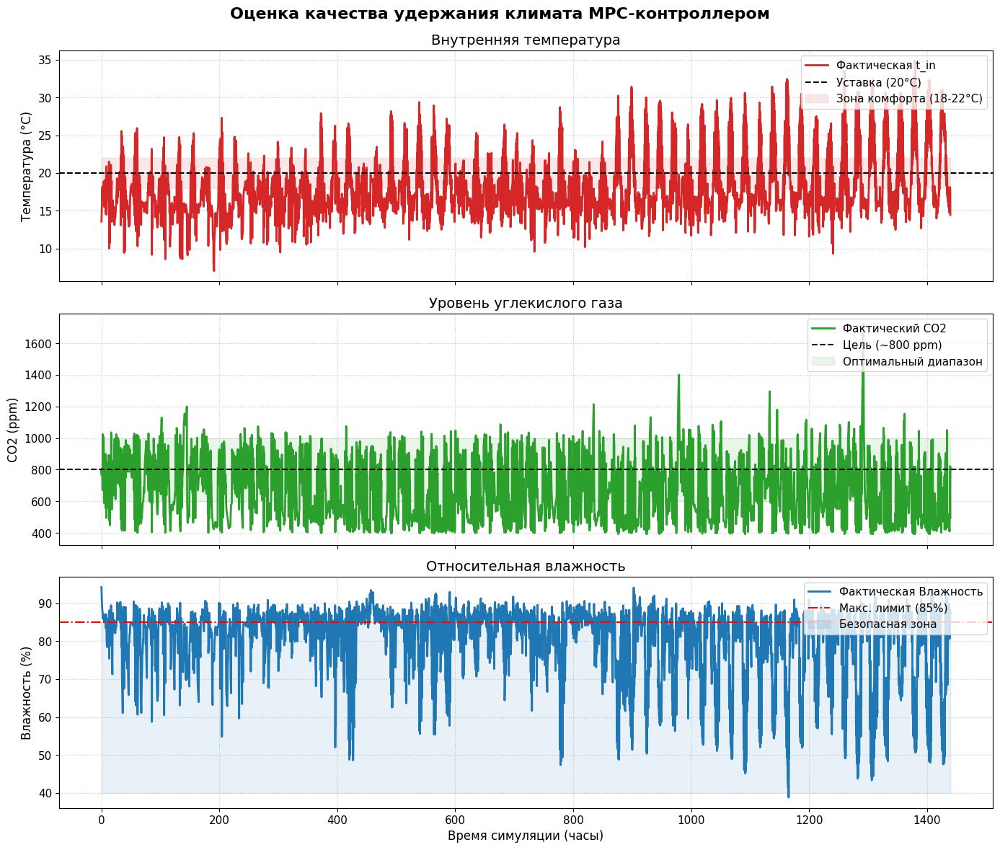

In [10]:
import matplotlib.pyplot as plt
import numpy as np

# Предполагаем, что у вас есть списки с результатами симуляции:
# temps_in, co2_levels, rh_levels
# PERIOD = 900 (15 минут)

# Создаем вектор времени в часах для удобства восприятия (ось X)
time_hours = np.arange(len(temps_in)) * (PERIOD / 3600.0)

# Настройка полотна
fig, axs = plt.subplots(3, 1, figsize=(14, 12), sharex=True)
fig.suptitle('Оценка качества удержания климата MPC-контроллером', fontsize=16, fontweight='bold')

# ==========================================
# 1. Температура
# ==========================================
axs[0].plot(time_hours, temps_in, label='Фактическая t_in', color='tab:red', linewidth=2)
# Целевая уставка (как мы задали в mpc.set_objective)
axs[0].axhline(20.0, color='black', linestyle='--', linewidth=1.5, label='Уставка (20°C)')
# Визуальный коридор комфорта (например, +/- 2 градуса)
axs[0].fill_between(time_hours, 18.0, 22.0, color='tab:red', alpha=0.1, label='Зона комфорта (18-22°C)')

axs[0].set_ylabel('Температура (°C)', fontsize=12)
axs[0].set_title('Внутренняя температура', fontsize=14)
axs[0].legend(loc='upper right')
axs[0].grid(True, linestyle=':', alpha=0.7)

# ==========================================
# 2. Уровень CO2
# ==========================================
axs[1].plot(time_hours, co2_levels, label='Фактический CO2', color='tab:green', linewidth=2)
# Предполагаемая цель (обычно около 800 ppm днем)
axs[1].axhline(800.0, color='black', linestyle='--', linewidth=1.5, label='Цель (~800 ppm)')
axs[1].fill_between(time_hours, 600.0, 1000.0, color='tab:green', alpha=0.1, label='Оптимальный диапазон')

axs[1].set_ylabel('CO2 (ppm)', fontsize=12)
axs[1].set_title('Уровень углекислого газа', fontsize=14)
axs[1].legend(loc='upper right')
axs[1].grid(True, linestyle=':', alpha=0.7)

# ==========================================
# 3. Влажность (RH)
# ==========================================
axs[2].plot(time_hours, rh_levels, label='Фактическая Влажность', color='tab:blue', linewidth=2)
# Максимально допустимая влажность (по настройкам Rule-Based это 85%)
axs[2].axhline(85.0, color='red', linestyle='-.', linewidth=1.5, label='Макс. лимит (85%)')
axs[2].fill_between(time_hours, 40.0, 85.0, color='tab:blue', alpha=0.1, label='Безопасная зона')

axs[2].set_ylabel('Влажность (%)', fontsize=12)
axs[2].set_xlabel('Время симуляции (часы)', fontsize=12)
axs[2].set_title('Относительная влажность', fontsize=14)
axs[2].legend(loc='upper right')
axs[2].grid(True, linestyle=':', alpha=0.7)

# Оптимизация отступов
plt.tight_layout()
fig.subplots_adjust(top=0.93) # Оставляем место для главного заголовка
plt.show()

In [ ]:
import numpy as np
import casadi as ca
import do_mpc
import pysindy as ps
from sklearn.preprocessing import StandardScaler

def compute_physics_features(states_arr, weather_arr, time_sin_cos, actions_raw_arr):
    """
    Пересчитывает ваши physics-informed признаки для новых данных.
    states_arr: [t_in, co2, rh]
    weather_arr: [T_out, rad, co2_out]
    time_sin_cos: [sin_h, cos_h]
    actions_raw_arr: [uBoil, uCO2, uThScr, uVent, uLamp, uBlScr]
    """
    t_in = states_arr[:, 0]
    co2 = states_arr[:, 1]
    rh = states_arr[:, 2]
    
    T_out = weather_arr[:, 0]
    rad = weather_arr[:, 1]
    co2_out = weather_arr[:, 2]
    
    # Считаем физику
    psat = 0.6108 * np.exp(17.27 * t_in / (t_in + 237.3))
    vpd = (1.0 - rh / 100.0) * psat
    S_eff = rad * (1.0 - actions_raw_arr[:, 2]) # uThScr
    
    t_S_eff = t_in * S_eff
    h_uVent = rh * actions_raw_arr[:, 3] # uVent
    dc_ext = co2 - co2_out
    dc_uVent = dc_ext * actions_raw_arr[:, 3]
    t_uBoil = t_in * actions_raw_arr[:, 0] # uBoil
    
    # Собираем вектор 'u' в том же порядке, что и раньше
    actions_phys = np.column_stack([
        T_out, rad, co2_out, time_sin_cos[:, 0], time_sin_cos[:, 1],
        actions_raw_arr,
        psat, vpd, S_eff, t_S_eff, h_uVent, dc_uVent, t_uBoil
    ])
    
    return actions_phys

def build_mpc_controller(sindy_model, scaler_x, scaler_u, weather_provider):
    """Создает новый do_mpc контроллер с обновленными уравнениями SINDy"""
    model = do_mpc.model.Model('discrete')
    
    # 1. Переменные
    t_in = model.set_variable('_x', 't_in')
    co2  = model.set_variable('_x', 'co2')
    rh   = model.set_variable('_x', 'rh')
    
    uBoil  = model.set_variable('_u', 'uBoil')
    uCO2   = model.set_variable('_u', 'uCO2')
    uThScr = model.set_variable('_u', 'uThScr')
    uVent  = model.set_variable('_u', 'uVent')
    uLamp  = model.set_variable('_u', 'uLamp')
    uBlScr = model.set_variable('_u', 'uBlScr')
    
    T_out   = model.set_variable('_tvp', 'T_out')
    rad     = model.set_variable('_tvp', 'rad')
    co2_out = model.set_variable('_tvp', 'co2_out')
    sin_h   = model.set_variable('_tvp', 'sin_h')
    cos_h   = model.set_variable('_tvp', 'cos_h')

    # 2. Физика в CasADi
    psat = 0.6108 * ca.exp(17.27 * t_in / (t_in + 237.3))
    vpd  = (1.0 - rh / 100.0) * psat
    S_eff = rad * (1.0 - uThScr)
    
    x_raw = ca.vertcat(t_in, co2, rh)
    u_raw = ca.vertcat(
        T_out, rad, co2_out, sin_h, cos_h,
        uBoil, uCO2, uThScr, uVent, uLamp, uBlScr,
        psat, vpd, S_eff, t_in*S_eff, rh*uVent, (co2-co2_out)*uVent, t_in*uBoil
    )

    # 3. Нормализация
    x_scaled = (x_raw - scaler_x.mean_) / scaler_x.scale_
    u_scaled = (u_raw - scaler_u.mean_) / scaler_u.scale_

    # 4. SINDy предсказание
    coefs = sindy_model.coefficients()
    library_vector = ca.vertcat(1, x_scaled, u_scaled)
    x_next_scaled = coefs @ library_vector
    
    # 5. Обратная нормализация
    x_next_raw = (x_next_scaled * scaler_x.scale_) + scaler_x.mean_
    
    model.set_rhs('t_in', x_next_raw[0])
    model.set_rhs('co2',  x_next_raw[1])
    model.set_rhs('rh',   x_next_raw[2])
    model.setup()

    # --- Настройка MPC ---
    mpc = do_mpc.controller.MPC(model)
    mpc.set_param(n_horizon=20, t_step=900, n_robust=0, store_full_solution=True)
    
    # 1. НОРМАЛИЗОВАННЫЕ ОШИБКИ (Приводим все к единому масштабу ~0..1)
    err_T = (t_in - 20.0) / 5.0          # 1.0 = ошибка в 5°C
    err_co2 = (co2 - 800.0) / 200.0      # 1.0 = ошибка в 200 ppm
    err_rh = ca.fmax(0, rh - 85.0) / 5.0 # 1.0 = превышение лимита 85% на 5% (возвращаем 85!)
    
    # Теперь веса отражают РЕАЛЬНЫЕ приоритеты (100 = высший приоритет)
    cost_temp = 100 * (err_T**2)
    cost_co2  = 30  * (err_co2**2) # CO2 важен, но меньше, чем замерзание
    cost_rh   = 50  * (err_rh**2)
    
    # Штраф за актуаторы (стараемся экономить газ и лампы)
    cost_energy = 20 * uBoil + 10 * uLamp + 2 * uCO2 # Убрал квадрат, чтобы штраф был линейным расходу
    
    lterm = cost_temp + cost_co2 + cost_rh + cost_energy
    mterm = cost_temp + cost_co2 + cost_rh
    mpc.set_objective(mterm=mterm, lterm=lterm)
    
    # 2. Тюнинг R-term (Успокаиваем механизмы)
    mpc.set_rterm(
        uBoil=10.0,   
        uCO2=5.0,     
        uThScr=100.0, # Запрещаем часто дергать экран (он медленный)
        uVent=50.0,   
        uLamp=1.0,
        uBlScr=1.0
    )
    
    # 3. Умные границы
    for u_name in ['uBoil', 'uCO2', 'uThScr', 'uVent', 'uLamp', 'uBlScr']:
        mpc.bounds['lower', '_u', u_name] = 0.0
        mpc.bounds['upper', '_u', u_name] = 1.0
        
    # Зимой форточки нельзя открывать больше чем на 30-40%, иначе всё вымерзнет моментально
    mpc.bounds['upper', '_u', 'uVent'] = 0.4 
        
    mpc.bounds['lower', '_x', 't_in'] = 12.0 # Жесткий лимит защиты от замерзания
    mpc.bounds['upper', '_x', 't_in'] = 35.0
    
    mpc.set_tvp_fun(weather_provider.get_mpc_tvp_fun(mpc))
    mpc.setup()
    
    return mpc

In [12]:
# ================================================================================
# ИТЕРАЦИЯ 0: Инициализация и базовое обучение (Rule-Based Controller)
# ================================================================================
print("="*50)
print(" ЗАПУСК ИТЕРАЦИИ 0 (Rule-Based Controller + Noise)")
print("="*50)

# 1. Настройки симуляции
PERIOD = 900
N_DAYS_0 = 60  # Для базовой модели берем большой кусок данных
STEPS_PER_DAY = int(86400 / PERIOD)
START_DATE = "2010-02-28"

NOISE_SCALE = 0.1
NOISE_PERIOD = 5

# 2. Подготовка среды и контроллера
env_0 = gym.make(
    "gl_gym/GreenLightTomato-v0",
    normalize_actions=False,
    observation_modules=["IndoorClimateObservations", "WeatherObservations", "BasicCropObservations"],
    max_episode_steps=N_DAYS_0 * STEPS_PER_DAY
)

# Используем ваш базовый контроллер (считаем, что он инициализирован выше)
# controller = RuleBasedController(...) 

obs, _ = env_0.reset(options={"start_date": START_DATE}, seed=42)

# Списки для сбора сырых данных
states_0, weather_0, sin_cos_0, actions_0 = [], [], [], []

current_noise_step = NOISE_PERIOD
noise = None

print(f"Симуляция RBC на {N_DAYS_0} дней...")
while True:
    ctx = build_step_context(env_0)
    base_action = controller.predict(ctx).astype(np.float32)
    
    # Добавляем исследовательский шум
    if current_noise_step >= NOISE_PERIOD:
        noise = np.random.normal(loc=0.0, scale=NOISE_SCALE, size=base_action.shape)
        current_noise_step = 0
        
    noisy_action = base_action + noise
    action = np.clip(noisy_action, env_0.action_space.low, env_0.action_space.high).astype(np.float32)
    
    # Извлекаем данные ДО шага
    t_in = obs["IndoorClimateObservations"][1]
    co2 = obs["IndoorClimateObservations"][0]
    rh = obs["IndoorClimateObservations"][2]
    
    T_out = obs["WeatherObservations"][1]
    rad = obs["WeatherObservations"][0]
    co2_out = obs["WeatherObservations"][3]
    
    hour = (pd.to_datetime(START_DATE).hour + ctx.t * PERIOD / 3600.0) % 24
    
    states_0.append([t_in, co2, rh])
    weather_0.append([T_out, rad, co2_out])
    sin_cos_0.append([np.sin(2 * np.pi * hour / 24.0), np.cos(2 * np.pi * hour / 24.0)])
    actions_0.append(action.copy())
    
    # Шаг среды
    obs, _, terminated, truncated, _ = env_0.step(action)
    current_noise_step += 1
    
    if terminated or truncated:
        break

env_0.close()
print("Симуляция завершена. Обработка признаков...")

# 3. Преобразование в Numpy и расчет физических признаков
states_arr_0 = np.array(states_0)
weather_arr_0 = np.array(weather_0)
sin_cos_arr_0 = np.array(sin_cos_0)
actions_raw_arr_0 = np.array(actions_0)

# Используем нашу функцию для расчета физики (чтобы логика была 100% идентичной DAgger'у)
actions_phys_0 = compute_physics_features(states_arr_0, weather_arr_0, sin_cos_arr_0, actions_raw_arr_0)

# Имена признаков для SINDy
feature_names_phys = [
    "t_in", "co2", "rh", # состояния (3)
    "T_out", "rad", "co2_out", "sin_h", "cos_h", # внешние (5)
    "uBoil", "uCO2", "uThScr", "uVent", "uLamp", "uBlScr", # актуаторы (6)
    "psat", "vpd", "S_eff", # physics-informed нелинейные (3)
    "t_S_eff", "h_uVent", "dc_uVent", "t_uBoil", # cross-термы (4)
]

# 4. Нормализация (Обучаем скейлеры на Итерации 0)
scaler_states_0 = StandardScaler().fit(states_arr_0)
scaler_actions_0 = StandardScaler().fit(actions_phys_0)

x_scaled_0 = scaler_states_0.transform(states_arr_0)
u_scaled_0 = scaler_actions_0.transform(actions_phys_0)

# Разбиваем на x_in (k) и x_out (k+1)
x_in_0 = x_scaled_0[:-1]
x_out_0 = x_scaled_0[1:]
u_in_0 = u_scaled_0[:-1]

# 5. Обучение базовой SINDy модели
THR_PHYS = 0.05
ALPHA_PHYS = 0.01

print("Обучение базовой SINDy модели...")
model_phys_0 = ps.SINDy(
    optimizer=ps.STLSQ(threshold=THR_PHYS, alpha=ALPHA_PHYS, max_iter=200, normalize_columns=False),
    feature_library=ps.PolynomialLibrary(degree=1, include_bias=True),
)

dt = PERIOD
model_phys_0.fit(x_in_0, u=u_in_0, x_dot=x_out_0, t=dt, feature_names=feature_names_phys)

n_nz = np.count_nonzero(model_phys_0.coefficients())
n_total = model_phys_0.coefficients().size
print(f"Базовая модель обучена! Ненулевых коэффициентов: {n_nz}/{n_total}")

# ================================================================================
# ИНИЦИАЛИЗАЦИЯ ПЕРЕМЕННЫХ ДЛЯ DAGGER ЦИКЛА
# ================================================================================
# Накапливаем строго выровненные (сдвинутые) массивы k и k+1
dagger_x_in_raw = states_arr_0[:-1].copy()
dagger_u_in_raw = actions_phys_0[:-1].copy()
dagger_x_out_raw = states_arr_0[1:].copy()

current_sindy_model = model_phys_0
current_scaler_x = scaler_states_0
current_scaler_u = scaler_actions_0

 ЗАПУСК ИТЕРАЦИИ 0 (Rule-Based Controller + Noise)
Симуляция RBC на 60 дней...
Симуляция завершена. Обработка признаков...
Обучение базовой SINDy модели...
Базовая модель обучена! Ненулевых коэффициентов: 49/66


In [13]:
# Инициализация хранилищ DAgger базовыми данными из Rule-Based Controller (Итерация 0)
dagger_states = states.copy()
dagger_actions_phys = actions_phys.copy()
current_sindy_model = model_phys 

DAGGER_ITERATIONS = 3  # Сколько раз переобучаем
EPISODE_DAYS = 5       # Длина эпизода для сбора данных MPC (не берите сразу 60 дней!)
STEPS_PER_EPISODE = EPISODE_DAYS * int(86400 / PERIOD)

for iteration in range(1, DAGGER_ITERATIONS + 1):
    print(f"\n{'='*50}")
    print(f" ЗАПУСК DAGGER ИТЕРАЦИИ {iteration}")
    print(f"{'='*50}")
    
    # 1. Пересоздаем скейлеры на основе ВСЕХ накопленных данных
    current_scaler_x = StandardScaler().fit(dagger_states)
    current_scaler_u = StandardScaler().fit(dagger_actions_phys)
    
    # 2. Создаем/обновляем прогноз погоды для MPC
    wp = WeatherForecastTVP("gl_gym/GreenLightTomato-v0", START_DATE, EPISODE_DAYS, PERIOD, HORIZON)
    
    # 3. Собираем MPC с текущей SINDy моделью
    mpc = build_mpc_controller(current_sindy_model, current_scaler_x, current_scaler_u, wp)
    
    # 4. Запускаем симуляцию для сбора НОВЫХ данных
    env = gym.make("gl_gym/GreenLightTomato-v0", normalize_actions=False, 
                   observation_modules=["IndoorClimateObservations", "WeatherObservations", "BasicCropObservations"])
    obs, _ = env.reset(options={"start_date": START_DATE}, seed=42)
    
    x0 = np.array([obs["IndoorClimateObservations"][1], obs["IndoorClimateObservations"][0], obs["IndoorClimateObservations"][2]]).reshape(-1, 1)
    mpc.x0 = x0
    mpc.set_initial_guess()
    
    # Списки для новых данных текущей итерации
    new_states, new_weather, new_sin_cos, new_actions = [], [], [], []
    
    print("Запуск MPC в среде...")
    for step in range(STEPS_PER_EPISODE):
        # 4.1 Получаем действие от MPC
        u_optimal = mpc.make_step(x0).flatten().astype(np.float32)
        u_optimal = np.clip(u_optimal, 0.0, 1.0) # Защита от числовых ошибок
        
        # Сохраняем состояния ДО шага (x_k) и действия (u_k)
        new_states.append(x0.flatten())
        new_actions.append(u_optimal)
        new_weather.append([obs["WeatherObservations"][1], obs["WeatherObservations"][0], obs["WeatherObservations"][3]])
        
        hour = (pd.to_datetime(START_DATE).hour + step * PERIOD / 3600.0) % 24
        new_sin_cos.append([np.sin(2 * np.pi * hour / 24.0), np.cos(2 * np.pi * hour / 24.0)])
        
        # 4.2 Шаг среды
        obs, _, terminated, truncated, _ = env.step(u_optimal)
        
        x0 = np.array([obs["IndoorClimateObservations"][1], obs["IndoorClimateObservations"][0], obs["IndoorClimateObservations"][2]]).reshape(-1, 1)
        
        # Early Stopping: Если MPC сломал теплицу (например, выморозил), прерываем эпизод!
        if x0[0] < 2.0 or x0[0] > 45.0:
            print(f"[!] АВАРИЯ: Температура {x0[0]}°C на шаге {step}. Прерывание эпизода для переобучения!")
            break
            
        if terminated or truncated:
            break
            
    env.close()
    
    # Обязательно добавляем последнее состояние для корректного сдвига (x_k+1)
    new_states.append(x0.flatten())
    
    # 5. Обработка новых данных
    new_states_arr = np.array(new_states)
    new_actions_phys = compute_physics_features(
        new_states_arr[:-1], np.array(new_weather), np.array(new_sin_cos), np.array(new_actions)
    )
    
    print(f"Собрано {len(new_actions_phys)} новых точек опыта.")
    
    # 6. АГРЕГАЦИЯ (Dataset Aggregation - суть DAgger)
    # new_states_arr[:-1] - состояния на шаге k
    # new_actions_phys    - действия на шаге k
    # new_states_arr[1:]  - состояния на шаге k+1
    
    dagger_x_in_raw = np.vstack([dagger_x_in_raw, new_states_arr[:-1]])
    dagger_u_in_raw = np.vstack([dagger_u_in_raw, new_actions_phys])
    dagger_x_out_raw = np.vstack([dagger_x_out_raw, new_states_arr[1:]])
    
    # Обновляем скейлеры и нормализуем ВСЕ накопленные данные разом
    full_x_in = current_scaler_x.fit_transform(dagger_x_in_raw)
    full_u_in = current_scaler_u.fit_transform(dagger_u_in_raw)
    full_y_train = current_scaler_x.transform(dagger_x_out_raw)
    
    # 7. ПЕРЕОБУЧЕНИЕ SINDy
    print("Переобучение SINDy на агрегированных данных...")
    current_sindy_model = ps.SINDy(
        optimizer=ps.STLSQ(threshold=THR_PHYS, alpha=ALPHA_PHYS, max_iter=200, normalize_columns=False),
        feature_library=ps.PolynomialLibrary(degree=1, include_bias=True),
    )
    
    current_sindy_model.fit(
        full_x_in, u=full_u_in, x_dot=full_y_train, t=dt, feature_names=feature_names_phys
    )
    
    n_nz = np.count_nonzero(current_sindy_model.coefficients())
    n_total = current_sindy_model.coefficients().size
    print(f"Новая модель: ненулевых коэффициентов {n_nz}/{n_total}")

print("\nDAgger цикл завершен! Модель готова к финальному тестированию.")       


 ЗАПУСК DAGGER ИТЕРАЦИИ 1
Сбор прогноза погоды на 500 шагов...
Сбор погоды успешно завершен!
Запуск MPC в среде...


C:\Users\zergu\AppData\Local\Temp\ipykernel_20248\2429376816.py:92: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  k_start = int(t_now / self.period)



******************************************************************************
This program contains Ipopt, a library for large-scale nonlinear optimization.
 Ipopt is released as open source code under the Eclipse Public License (EPL).
         For more information visit https://github.com/coin-or/Ipopt
******************************************************************************

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      463
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:      397

Total number of variables............................:      183
                     variables with only lower bounds:        0
                variables with lower and upper bounds:      139
                     variables with only upper bounds:        0
Total number of equality constraints.................:       63
Total number of inequality c

C:\Users\zergu\AppData\Local\Temp\ipykernel_20248\2429376816.py:92: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  k_start = int(t_now / self.period)


iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  20  1.7074771e+04 3.77e-01 7.38e+00  -1.0 9.80e+00    -  1.00e+00 7.26e-01f  1
  21  1.7065700e+04 1.68e-02 1.96e-02  -1.0 2.67e+00    -  1.00e+00 1.00e+00f  1
  22  1.7038426e+04 2.90e-02 4.93e-01  -1.7 8.79e-01    -  8.94e-01 1.00e+00f  1
  23  1.7035342e+04 1.63e-03 1.82e-04  -1.7 2.36e-01    -  1.00e+00 1.00e+00h  1
  24  1.7027394e+04 3.67e-03 7.48e-02  -3.8 1.53e-01    -  9.13e-01 1.00e+00f  1
  25  1.7027126e+04 2.20e-05 4.39e-07  -3.8 9.97e-03    -  1.00e+00 1.00e+00h  1
  26  1.7027063e+04 2.67e-07 1.87e-08  -5.7 1.16e-03    -  1.00e+00 1.00e+00f  1
  27  1.7027062e+04 3.90e-11 2.65e-12  -8.6 1.38e-05    -  1.00e+00 1.00e+00h  1

Number of Iterations....: 27

                                   (scaled)                 (unscaled)
Objective...............:   2.8378436314855453e+03    1.7027061788913274e+04
Dual infeasibility......:   2.6451409566182978e-12    1.5870845739709787e-11
Constraint viol

C:\Users\zergu\AppData\Local\Temp\ipykernel_20248\2429376816.py:92: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  k_start = int(t_now / self.period)


  15  1.6761729e+04 2.48e+00 3.98e+01  -1.0 3.19e+01    -  6.84e-01 4.07e-01f  1
  16  1.6259849e+04 5.62e-01 4.73e+00  -1.0 1.89e+01    -  1.00e+00 8.72e-01f  1
  17  1.6254201e+04 1.01e-02 6.51e-03  -1.0 2.42e+00    -  1.00e+00 1.00e+00f  1
  18  1.6224441e+04 3.73e-02 4.81e-01  -2.5 4.64e-01    -  8.23e-01 1.00e+00f  1
  19  1.6220049e+04 2.02e-03 1.55e-05  -2.5 1.47e-02    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  20  1.6218773e+04 6.88e-05 2.10e-06  -3.8 1.34e-02    -  1.00e+00 1.00e+00f  1
  21  1.6218704e+04 2.07e-07 5.30e-09  -5.7 6.33e-04    -  1.00e+00 1.00e+00h  1
  22  1.6218703e+04 1.77e-11 8.45e-13  -8.6 8.46e-06    -  1.00e+00 1.00e+00h  1

Number of Iterations....: 22

                                   (scaled)                 (unscaled)
Objective...............:   2.7031171771227346e+03    1.6218703062736407e+04
Dual infeasibility......:   8.4465744801240686e-13    5.0679446880744412e-12
Constraint viol

In [38]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import gymnasium as gym

# ================================================================================
# ФИНАЛЬНОЕ ТЕСТИРОВАНИЕ ОБУЧЕННОГО MPC
# ================================================================================
print("="*50)
print(" ЗАПУСК ФИНАЛЬНОГО ТЕСТИРОВАНИЯ (Post-DAgger)")
print("="*50)

TEST_DAYS = 30  # Возьмем 30 дней для наглядного графика
PERIOD = 900
STEPS_PER_TEST = int(86400 / PERIOD) * TEST_DAYS
START_DATE = "2010-02-28"
HORIZON = 20

# 1. Готовим погоду на весь период теста
print("Подготовка прогноза погоды...")
wp_test = WeatherForecastTVP("gl_gym/GreenLightTomato-v0", START_DATE, TEST_DAYS, PERIOD, HORIZON)

# 2. Собираем финальный контроллер
print("Сборка финального MPC контроллера...")
mpc_test = build_mpc_controller(current_sindy_model, current_scaler_x, current_scaler_u, wp_test)

# 3. Инициализация среды
env_test = gym.make(
    "gl_gym/GreenLightTomato-v0", 
    normalize_actions=False, 
    observation_modules=["IndoorClimateObservations", "WeatherObservations", "BasicCropObservations"],
    max_episode_steps=STEPS_PER_TEST
)

obs, _ = env_test.reset(options={"start_date": START_DATE}, seed=42)

x0 = np.array([
    obs["IndoorClimateObservations"][1], 
    obs["IndoorClimateObservations"][0], 
    obs["IndoorClimateObservations"][2]
]).reshape(-1, 1)

mpc_test.x0 = x0
mpc_test.set_initial_guess()

# Списки для хранения результатов
test_temps = []
test_co2 = []
test_rh = []

test_T_out = []
test_rad = []
test_co2_out = []
test_sin_h = []
test_cos_h = []

test_uboil = []
test_uco2 = []
test_uthscr = []
test_uvent = []
test_uLamp = []
test_uBlscr = []

test_T_out = []
test_rad = []

print(f"Запуск симуляции на {TEST_DAYS} дней. Это может занять пару минут...")

for step in range(STEPS_PER_TEST):
    # Получаем действие от MPC
    u_optimal = mpc_test.make_step(x0).flatten().astype(np.float32)

    test_uboil.append(u_optimal[0])
    test_uco2.append(u_optimal[1])
    test_uthscr.append(u_optimal[2])
    test_uvent.append(u_optimal[3])
    test_uLamp.append(u_optimal[4])
    test_uBlscr.append(u_optimal[5])

    u_optimal = np.clip(u_optimal, 0.0, 1.0)
    
    # Делаем шаг в среде
    obs, _, terminated, truncated, _ = env_test.step(u_optimal)
    
    # Обновляем состояния
    t_in = obs["IndoorClimateObservations"][1]
    co2 = obs["IndoorClimateObservations"][0]
    rh = obs["IndoorClimateObservations"][2]

    T_out = obs["WeatherObservations"][1]
    rad = obs["WeatherObservations"][0]
    
    x0 = np.array([t_in, co2, rh]).reshape(-1, 1)

    test_T_out.append(T_out)
    test_rad.append(rad)
    
    # Сохраняем для графиков
    test_temps.append(t_in)
    test_co2.append(co2)
    test_rh.append(rh)
    
    if step % (STEPS_PER_TEST // 10) == 0 and step > 0:
        print(f"Прогресс: {step / STEPS_PER_TEST * 100:.0f}% завершено")
        
    if terminated or truncated:
        break

env_test.close()
print("Симуляция успешно завершена! Строим графики...")

 ЗАПУСК ФИНАЛЬНОГО ТЕСТИРОВАНИЯ (Post-DAgger)
Подготовка прогноза погоды...
Сбор прогноза погоды на 2900 шагов...
Сбор погоды успешно завершен!
Сборка финального MPC контроллера...
Запуск симуляции на 30 дней. Это может занять пару минут...
This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      543
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:      397

Total number of variables............................:      183
                     variables with only lower bounds:        0
                variables with lower and upper bounds:      139
                     variables with only upper bounds:        0
Total number of equality constraints.................:       63
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper

C:\Users\zergu\AppData\Local\Temp\ipykernel_20248\2429376816.py:92: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  k_start = int(t_now / self.period)


   2  1.7354890e+04 3.94e+02 7.53e+01  -1.0 3.98e+02    -  1.40e-01 1.08e-02f  1
   3  1.7006025e+04 3.75e+02 7.16e+01  -1.0 3.94e+02    -  3.56e-02 4.91e-02f  1
   4  1.6694690e+04 3.51e+02 4.89e+02  -1.0 3.75e+02    -  7.49e-01 6.37e-02f  1
   5  1.6265636e+04 2.64e+02 3.40e+02  -1.0 3.51e+02    -  1.24e-01 2.48e-01f  1
   6  1.7065330e+04 1.60e+02 1.65e+02  -1.0 2.64e+02    -  1.89e-01 3.94e-01h  1
   7  1.7493110e+04 9.93e+01 1.60e+02  -1.0 1.60e+02    -  4.33e-03 3.80e-01h  1
   8  1.7480401e+04 7.01e+01 1.27e+02  -1.0 9.93e+01    -  1.32e-02 2.94e-01f  1
   9  1.7480238e+04 6.97e+01 7.26e+01  -1.0 7.01e+01    -  5.69e-01 5.54e-03h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  1.8489425e+04 2.96e-01 1.55e+01  -1.0 6.97e+01    -  1.00e+00 1.00e+00h  1
  11  1.8482434e+04 1.58e-04 1.90e-03  -1.0 1.70e-01    -  1.00e+00 1.00e+00f  1
  12  1.8447958e+04 4.63e-02 1.23e+00  -2.5 1.67e-01    -  7.15e-01 1.00e+00f  1
  13  1.8444373e+04 6.41e-03

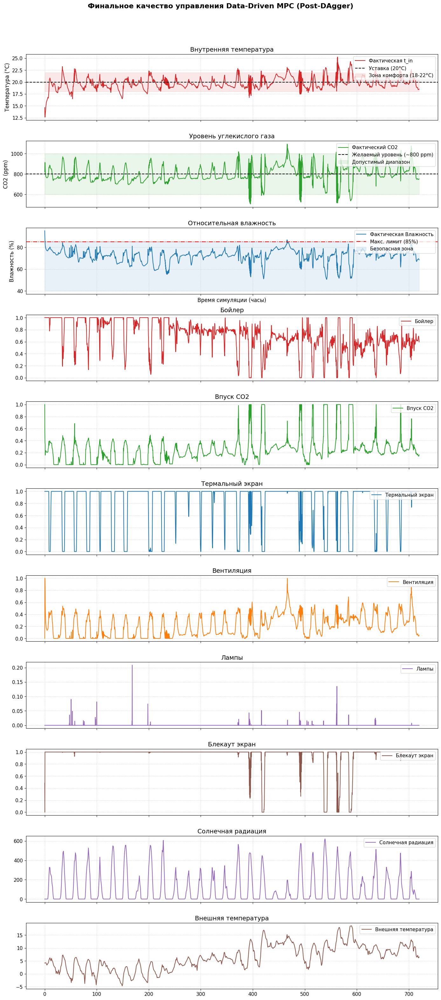

In [42]:
# ================================================================================
# ПОСТРОЕНИЕ ГРАФИКОВ
# ================================================================================
# time_hours = np.arange(len(test_temps)) * (PERIOD / 3600.0)
time_hours = np.arange(len(test_temps)) * (PERIOD / 3600.0)

fig, axs = plt.subplots(11, 1, figsize=(14, 32), sharex=True)
fig.suptitle('Финальное качество управления Data-Driven MPC (Post-DAgger)', fontsize=16, fontweight='bold')

# 1. Температура
axs[0].plot(time_hours, test_temps, label='Фактическая t_in', color='tab:red', linewidth=1.5)
axs[0].axhline(20.0, color='black', linestyle='--', linewidth=1.5, label='Уставка (20°C)')
axs[0].fill_between(time_hours, 18.0, 22.0, color='tab:red', alpha=0.1, label='Зона комфорта (18-22°C)')
axs[0].set_ylabel('Температура (°C)', fontsize=12)
axs[0].set_title('Внутренняя температура', fontsize=14)
axs[0].legend(loc='upper right')
axs[0].grid(True, linestyle=':', alpha=0.7)

# 2. Уровень CO2
axs[1].plot(time_hours, test_co2, label='Фактический CO2', color='tab:green', linewidth=1.5)
axs[1].axhline(800.0, color='black', linestyle='--', linewidth=1.5, label='Желаемый уровень (~800 ppm)')
axs[1].fill_between(time_hours, 600.0, 1000.0, color='tab:green', alpha=0.1, label='Допустимый диапазон')
axs[1].set_ylabel('CO2 (ppm)', fontsize=12)
axs[1].set_title('Уровень углекислого газа', fontsize=14)
axs[1].legend(loc='upper right')
axs[1].grid(True, linestyle=':', alpha=0.7)

# 3. Влажность
axs[2].plot(time_hours, test_rh, label='Фактическая Влажность', color='tab:blue', linewidth=1.5)
axs[2].axhline(85.0, color='red', linestyle='-.', linewidth=1.5, label='Макс. лимит (85%)')
axs[2].fill_between(time_hours, 40.0, 85.0, color='tab:blue', alpha=0.1, label='Безопасная зона')
axs[2].set_ylabel('Влажность (%)', fontsize=12)
axs[2].set_xlabel('Время симуляции (часы)', fontsize=12)
axs[2].set_title('Относительная влажность', fontsize=14)
axs[2].legend(loc='upper right')
axs[2].grid(True, linestyle=':', alpha=0.7)

axs[3].plot(time_hours, test_uboil, label='Бойлер', color='tab:red', linewidth=1.5)
axs[3].set_title('Бойлер', fontsize=14)
axs[3].legend(loc='upper right')
axs[3].grid(True, linestyle=':', alpha=0.7)

axs[4].plot(time_hours, test_uco2, label='Впуск CO2', color='tab:green', linewidth=1.5)
axs[4].set_title('Впуск CO2', fontsize=14)
axs[4].legend(loc='upper right')
axs[4].grid(True, linestyle=':', alpha=0.7)

axs[5].plot(time_hours, test_uthscr, label='Термальный экран', color='tab:blue', linewidth=1.5)
axs[5].set_title('Термальный экран', fontsize=14)
axs[5].legend(loc='upper right')
axs[5].grid(True, linestyle=':', alpha=0.7)

axs[6].plot(time_hours, test_uvent, label='Вентиляция', color='tab:orange', linewidth=1.5)
axs[6].set_title('Вентиляция', fontsize=14)
axs[6].legend(loc='upper right')
axs[6].grid(True, linestyle=':', alpha=0.7)

axs[7].plot(time_hours, test_uLamp, label='Лампы', color='tab:purple', linewidth=1.5)
axs[7].set_title('Лампы', fontsize=14)
axs[7].legend(loc='upper right')
axs[7].grid(True, linestyle=':', alpha=0.7)

axs[8].plot(time_hours, test_uBlscr, label='Блекаут экран', color='tab:brown', linewidth=1.5)
axs[8].set_title('Блекаут экран', fontsize=14)
axs[8].legend(loc='upper right')
axs[8].grid(True, linestyle=':', alpha=0.7)

axs[9].plot(time_hours, test_rad, label='Солнечная радиация', color='tab:purple', linewidth=1.5)
axs[9].set_title('Солнечная радиация', fontsize=14)
axs[9].legend(loc='upper right')
axs[9].grid(True, linestyle=':', alpha=0.7)

axs[10].plot(time_hours, test_T_out, label='Внешняя температура', color='tab:brown', linewidth=1.5)
axs[10].set_title('Внешняя температура', fontsize=14)
axs[10].legend(loc='upper right')
axs[10].grid(True, linestyle=':', alpha=0.7)

plt.tight_layout()
fig.subplots_adjust(top=0.93)
plt.show()